In [119]:
import pandas as pd
import numpy as np
import trueskill as ts
import altair as alt
from pprint import pprint
from trueskill_simulation import *

%load_ext autoreload
%autoreload 2

alt.data_transformers.disable_max_rows()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


DataTransformerRegistry.enable('default')

In [135]:
self = TrueskillSimulation(N=6, M=300, beta=.1)
self.simulate_data()

In [136]:
self.plot_skills(first_k=4)

alt.Chart(...)

In [137]:
self.plot_2_player_wins()

alt.LayerChart(...)

In [138]:
self.apply_true_skill()

In [142]:
self.plot_player(3, include_performance=False, width=600, height=300)

alt.LayerChart(...)

In [49]:
self.plot_skills(3)

alt.Chart(...)

In [55]:
self.performances[:first_k, :].max(0)

(30,)

In [68]:
first_k = 2
df_skills = pd.DataFrame(self.skills[:first_k, :])
df_skills = df_skills.reset_index().melt(
    id_vars="index", var_name="m", value_name="skill_value"
)
chart_skills = (
    alt.Chart(df_skills)
    .mark_line()
    .encode(
        x=alt.X("m:Q", title="Match (m)"),
        y=alt.Y("skill_value:Q", title="Skill", scale=alt.Scale(zero=False)),
        color=alt.Color("index:N", title="Player"),
    )
    .properties(
        title=f"Skills of {first_k} players over {self.M} Matches", width=700, height=300
    )
)

df_performances = pd.DataFrame(self.performances[:first_k, :])
df_performances = df_performances.reset_index().melt(
    id_vars="index", var_name="m", value_name="performance"
)
chart_performances = (
    alt.Chart(df_performances)
    .mark_point(strokeWidth=0, opacity=.8, size=100)
    .encode(
        x=alt.X("m:Q", title="Match (m)"),
        y=alt.Y("performance:Q", title="Skill", scale=alt.Scale(zero=False)),
        fill=alt.Fill("index:N", title="Player"),
    )
)
df_performance_winner = pd.DataFrame({'winner': self.performances[:first_k, :].max(0)}).reset_index()

chart_winners = (
    alt.Chart(df_performance_winner)
    .mark_point(strokeWidth=3.5, opacity=1, size=200, color='black')
    .encode(
        x=alt.X("index:Q", title="Match (m)"),
        y=alt.Y("winner:Q", title="Skill", scale=alt.Scale(zero=False)),
    )
)

(chart_skills + chart_performances + chart_winners).configure_axis(grid=False)

alt.LayerChart(...)

In [61]:
df_performance_winner

,winner
0,15.090649
1,15.047553
2,15.086387
3,15.068675
4,15.113308
5,15.133064
6,15.143389
7,15.098128
8,15.105251
9,15.130429


In [20]:
first_k = 2

# Create dataframes for skills and performance
df_skills = pd.DataFrame(self.skills[:first_k, :])
df_skills = df_skills.reset_index().melt(
    id_vars="index", var_name="m", value_name="skill_value"
)

df_performance = pd.DataFrame(self.performances[:first_k, :])
df_performance = df_performance.reset_index().melt(
    id_vars="index", var_name="m", value_name="performance_value"
)

# Merge the skills and performance into one dataframe
df_combined = pd.merge(df_skills, df_performance, on=["index", "m"])

# Calculate which value is higher for each m
df_combined['higher_value'] = df_combined[['skill_value', 'performance_value']].max(axis=1)
df_combined['is_higher'] = (df_combined['higher_value'] == df_combined['skill_value']).astype(int)

# Line plot for skills
line_chart = alt.Chart(df_skills).mark_line().encode(
    x=alt.X("m:Q", title="Match (m)"),
    y=alt.Y("skill_value:Q", title="Skill", scale=alt.Scale(zero=False)),
    detail=alt.Detail("index:N", title="Player"),
)

# Point plot for performance
point_chart = alt.Chart(df_combined).mark_point(filled=True).encode(
    x=alt.X("m:Q"),
    y=alt.Y("performance_value:Q"),
    color=alt.Color("index:N", title="Player"),
    shape=alt.Shape("index:N", title="Player")
)

# Highlight the higher value with a black circle
highlight_chart = alt.Chart(df_combined).mark_point(
    size=100, color="black", strokeWidth=2, shape='circle'
).encode(
    x=alt.X("m:Q"),
    y=alt.Y("higher_value:Q"),
    tooltip=["m", "skill_value", "performance_value"]
)

# Combine all the layers
chart = (
    (line_chart + point_chart + highlight_chart)
    .properties(
        title=f"Skills and Performance of {first_k} players over {self.M} Matches",
        width=700,
        height=300,
    )
    .configure_axis(grid=False)
)
chart

alt.LayerChart(...)

In [4]:
self.plot_errors(2)

alt.LayerChart(...)

In [6]:
self.plot_player(2)

alt.LayerChart(...)

## To-Dos:
* [ ] Simulate data according to True Skill

## NOTES:
* If one player is much better than another player, than you can't figure out what the skills are, because it's a huge set of skills where one always beats the other.
* If the teams are lop sided, like 3-2, than the larger team is very likely to win, and not much can be inferred.

In [2]:
u = np.random.uniform()
u

0.6805732872827138

In [48]:
?? ts.setup

Signature:
 ts.setup(
    mu=25.0,
    sigma=8.333333333333334,
    beta=4.166666666666667,
    tau=0.08333333333333334,
    draw_probability=0.1,
    backend=None,
    env=None,
)
Source:   
def setup(mu=MU, sigma=SIGMA, beta=BETA, tau=TAU,
          draw_probability=DRAW_PROBABILITY, backend=None, env=None):
    """Setups the global environment.

    :param env: the specific :class:`TrueSkill` object to be the global
                environment.  It is optional.

    >>> Rating()
    trueskill.Rating(mu=25.000, sigma=8.333)
    >>> setup(mu=50)  #doctest: +ELLIPSIS
    trueskill.TrueSkill(mu=50.000, ...)
    >>> Rating()
    trueskill.Rating(mu=50.000, sigma=8.333)

    """
    if env is None:
        env = TrueSkill(mu, sigma, beta, tau, draw_probability, backend)
    global_env.__trueskill__ = env
    return env
File:      c:\users\duane\envs\youtube311\lib\site-packages\trueskill\__init__.py
Type:      function

In [38]:
# np.random.seed(4)
N = 6*3 # Number of players. It's good to use a multiple of 6, to avoid uneven teams.
epsilon = .01 # Draw margin
T = 12000 # Number of games, which is also the number of timestamps.
gamma = .03 # ts.TAU # Standard deviation of skill changes between games.
beta = .25 # Standard deviation of a game's performance around a skill.
mu_0 = 15
sigma_0 = .1 # This needs to be small, so that

ts.setup(mu=mu_0, sigma=sigma_0, beta=beta, tau=gamma, draw_probability = 0.001)

# For convenience, we assume all players play exactly once, at each t. 
skills = np.random.normal(loc = mu_0, scale=sigma_0, size=(N, 1)) + np.random.normal(loc=0, scale=gamma, size=(N, T)).cumsum(axis=1)
performances = np.random.normal(loc=skills, scale=beta)

# Team assignments are random.
teams = np.zeros((N, T), dtype=int)
for t in range(T):
    # num_teams = np.random.choice(range(2, N+1))
    # teams[:, t] = np.random.permutation(np.concatenate([np.arange(num_teams)]*(N // 2 + 1))[:N])
    u = np.random.uniform()
    if u < 0.5:
        teams[:, t] = np.arange(N) # Free for all
    elif  u < .75:
        teams[:, t] = np.arange(N).repeat(2)[:N] # Teams of 2
    else:
        teams[:, t] = np.arange(N).repeat(3)[:N] # Teams of 3
        

team_performances = []
ranks = []

for t in range(T):
    performances_t = performances[:, t]
    teams_t = teams[:, t]

    team_performances_t = {}

    for p, team in enumerate(teams_t):
        if team in team_performances_t:
            team_performances_t[team] += performances_t[p]
        else:
            team_performances_t[team] = performances_t[p]

    ranks_t = sorted(team_performances_t, key = lambda x: -team_performances_t[x])
    
    team_performances.append(team_performances_t)
    ranks.append(ranks_t)
        

## Apply True Skill

In [39]:
ratings = []

# env = ts.TrueSkill(mu=6, sigma=1, beta=beta, tau=gamma)
# env.make_as_global()
ratings_t = [ts.Rating() for _ in range(N)]

for t in range(T):

    teams_t = teams[:, t]

    rating_groups = [{} for _ in range(max(teams_t) + 1)]
    for p, team in enumerate(teams_t):
        rating_groups[team][p] = ratings_t[p]

    rating_groups = [rating_groups[r] for r in ranks[t]]
    rating_groups_updated = ts.rate(rating_groups)
    rating_groups_updated_flat = {k: v for team in rating_groups_updated for k, v in team.items()}
    ratings_t_updated = [rating_groups_updated_flat[i] for i in range(N)]

    ratings_t_updated[0] = ts.Rating(mu=skills[0, t], sigma=ratings_t_updated[0].sigma) # CHEATING TO HANDLE NON-IDENTIFIABILITY
    ratings_t_updated[1] = ts.Rating(mu=skills[1, t], sigma=ratings_t_updated[1].sigma) # CHEATING TO HANDLE NON-IDENTIFIABILITY
    ratings_t_updated[2] = ts.Rating(mu=skills[2, t], sigma=ratings_t_updated[2].sigma) # CHEATING TO HANDLE NON-IDENTIFIABILITY
    
    ratings.append(ratings_t_updated)
    ratings_t = ratings_t_updated

In [40]:
def get_estimated_skill_df(skills, performances, ratings, p):
    skill_true = skills[p]
    performance = performances[p]
    skill_mu = [rat[p].mu for rat in ratings]
    skill_sigma = [rat[p].sigma for rat in ratings]
    return pd.DataFrame(dict(skill_true=skill_true, 
                             performance  = performance, 
                             skill_mu = skill_mu, 
                             skill_sigma = skill_sigma)).assign(z_error = (skill_true - skill_mu) / skill_sigma)

In [42]:
df_p = get_estimated_skill_df(skills, performances, ratings, 5)
print(df_p.head().to_string())

   skill_true  performance   skill_mu  skill_sigma   z_error
0   14.900721    15.185538  15.016337     0.101198 -1.142474
1   14.923168    14.728914  14.941892     0.099612 -0.187969
2   14.958970    14.694528  14.916217     0.102555  0.416879
3   14.889611    14.600823  14.851197     0.101046  0.380158
4   14.883400    14.674267  14.817853     0.098649  0.664448


In [43]:
from scipy.stats import norm

In [44]:
z_error = df_p['z_error']

In [45]:
# Create the histogram data (bin edges and counts)
hist, bin_edges = np.histogram(z_error, bins=50, density=True)

# Create a dataframe for the histogram data
hist_df = pd.DataFrame({
    'bin_start': bin_edges[:-1],
    'bin_end': bin_edges[1:],
    'density': hist
}).assign(zero=0)

# Create the standard normal distribution data
x_values = np.linspace(z_error.min(), z_error.max(), 100)
standard_normal = norm.pdf(x_values, loc=0, scale=1)
normal_df = pd.DataFrame({'x': x_values, 'y': standard_normal})

# Plot the histogram using Altair
histogram = alt.Chart(hist_df).mark_rect(opacity=0.5).encode(
    x=alt.X('bin_start:Q', title='z_error'),
    x2=alt.X2('bin_end:Q', title='z_error'),
    y=alt.Y('zero:Q', title='Density'),
    y2=alt.Y2('density:Q', title='Density'),
).properties(
    title='Normalized Histogram of z_error with Standard Normal Distribution Overlay'
)

# Plot the standard normal distribution as a line
normal_distribution = alt.Chart(normal_df).mark_line(color='red').encode(
    alt.X('x:Q', title='z_error'),
    alt.Y('y:Q', title='Density')
)

# Combine the histogram and the normal distribution line
chart = histogram + normal_distribution

chart

alt.LayerChart(...)

In [46]:
def plot_player(p, include_performance=True):
    df = get_estimated_skill_df(skills, performances, ratings, p)

    # Calculate 95% confidence intervals
    df['ci_upper'] = df['skill_mu'] + 1.96 * df['skill_sigma']
    df['ci_lower'] = df['skill_mu'] - 1.96 * df['skill_sigma']
    
    # Create the Altair plot with lines for skill_true and skill_mu, and shaded area for confidence interval
    line_true = alt.Chart(df.reset_index()).mark_line(color='blue').encode(
        x='index:Q',
        y=alt.Y('skill_true:Q', scale=alt.Scale(zero=False)),
    )
    performances_points = alt.Chart(df.reset_index()).mark_point(fill='red', opacity=.5, strokeWidth=0).encode(
        x='index:Q',
        y='performance:Q',
    )
    
    line_mu = alt.Chart(df.reset_index()).mark_line(color='green').encode(
        x='index:Q',
        y='skill_mu:Q',
    )
    
    ci_area = alt.Chart(df.reset_index()).mark_area(opacity=0.75, color='lightgreen').encode(
        x='index:Q',
        y='ci_lower:Q',
        y2='ci_upper:Q'
    )
    if include_performance:
        chart = performances_points + ci_area + line_mu + line_true
    else:
        chart = ci_area + line_mu + line_true
    
    # Combine all into one chart
    return chart.properties(
        width=600,
        height=400,
        title="Skill True vs Skill Mu with 95% Confidence Interval"
    )

In [47]:
# (plot_player(0) & plot_player(1)) | (plot_player(2) & plot_player(3))
(plot_player(4) & plot_player(5)) | (plot_player(6) & plot_player(7))
# plot_player(0) & plot_player(1)

alt.HConcatChart(...)

In [15]:
# For convenience, we assume all players play exactly once, at each t.
skill_over_games = np.random.normal(loc=0, scale=gamma, size=(N, T)).cumsum(axis=1)

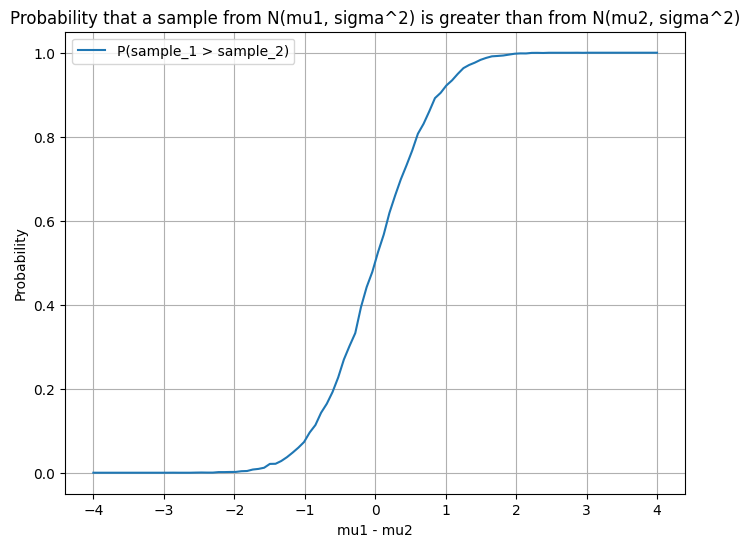

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
sigma = .5
mu2 = 0.0
mu1_values = np.linspace(-4, 4, 100)  # Range of mu1 values
num_samples = 10000

# Array to store the probabilities
probabilities = []

# Loop over each mu1 value
for mu1 in mu1_values:
    # Generate normal random samples
    samples_1 = np.random.normal(mu1, sigma, num_samples)
    samples_2 = np.random.normal(mu2, sigma, num_samples)
    
    # Calculate the number of times samples from set 1 are greater than those from set 2
    prob = np.mean(samples_1 > samples_2)
    probabilities.append(prob)

# Plot the results
plt.figure(figsize=(8, 6))
plt.plot(mu1_values - mu2, probabilities, label="P(sample_1 > sample_2)")
plt.xlabel('mu1 - mu2')
plt.ylabel('Probability')
plt.title('Probability that a sample from N(mu1, sigma^2) is greater than from N(mu2, sigma^2)')
plt.grid(True)
plt.legend()
plt.show()

In [11]:
import numpy as np
import trueskill as ts

# Set parameters
N = 4  # Number of players
T = 30  # Number of games (or timestamps)
gamma = 0.1  # Standard deviation of skill changes between games
beta = 0.0001  # Performance variance around skill
epsilon = 0.1  # Draw margin

# Initialize skills (True skills, for simulation purposes)
skills = np.random.uniform(low=24.99, high=25.01, size=(N, 1)) + np.random.normal(loc=0, scale=gamma, size=(N, T)).cumsum(axis=1)

# Initialize performances
performances = np.random.normal(loc=skills, scale=beta)

# Initialize TrueSkill ratings for each player
ratings = [ts.Rating() for _ in range(N)]

# Simulate games and update ratings
for t in range(T):
    # Get the performances and ranks for the current timestamp
    performances_t = performances[:, t]
    teams = np.arange(N)  # Each player is their own team (free-for-all)

    # Sort teams based on their performances (rank in decreasing order)
    sorted_teams = np.argsort(-performances_t)  # Negative for descending order
    ranks_t = np.argsort(sorted_teams)  # Ranks based on performance

    # Update TrueSkill ratings based on ranks
    rating_groups = [ratings[i] for i in range(N)]  # Each player is their own team
    ratings = ts.rate(rating_groups, ranks=ranks_t)

    # Display the updated ratings after each game
    print(f"After game {t+1}:")
    for i, rating in enumerate(ratings):
        print(f"Player {i+1} rating: mu={rating[0].mu:.3f}, sigma={rating[0].sigma:.3f}")

# Final player ratings after all games
print("\nFinal ratings:")
for i, rating in enumerate(ratings):
    print(f"Player {i+1} final rating: mu={rating[0].mu:.3f}, sigma={rating[0].sigma:.3f}")


TypeError: Rating cannot be a rating group